In [1]:
from config import *
from dataset import *
from model import *
from train import *
from visualize import *

from torch.utils.data import DataLoader
from sklearn.model_selection import train_test_split

%load_ext autoreload
%autoreload 2



/home/jichuanh/miniconda3/envs/open-mmlab/lib/python3.8/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [2]:
# BATCH_SIZE = 16
# N_EPOCHS = 1
# BACKBONE = 'resnet18'
# SUBMIT = False
# PAPERMILL_INPUT_PATH = None
# PAPERMILL_OUTPUT_PATH = None
# TQDM_DISABLED = False
# FPN = False
# CUT_AUG = None
# COLOR_AUG = None
# MASK_LOSS_TYPE = "default"
# # ONLY useful with bce
# LABEL_SMOOTHING = 0.0
# # starting learning rate
# LEARNING_RATE= 0.001
# CTIME_STR = None

In [3]:
weight_path = "2024-01-02-06-51-19-centernet-train-resnet18-epoch-50-focal-MultiStep/model_epoch_40.pth"

import os
save_folder, weight_file = os.path.split(weight_path)

import json
with open(os.path.join(save_folder, "config.json"), "r") as f:
    cfg = json.load(f)

TQDM_DISABLED = False

In [4]:
import pandas as pd
train_images_dir = PATH + 'train_images/{}.jpg'
test_images_dir = PATH + 'test_images/{}.jpg'

train = pd.read_csv(PATH + 'train.csv')
test = pd.read_csv(PATH + 'sample_submission.csv')

df_train = train
df_test = test

import numpy as np
import albumentations  # albumentations >= 1.0.0
from albumentations import pytorch as AT
test_transform = albumentations.Compose([
    AT.ToTensorV2()
])
train_dataset = CarDataset(df_train, train_images_dir, cfg=cfg,training=True, transform=test_transform)
test_dataset = CarDataset(df_test, test_images_dir, cfg=cfg,training=False, transform=test_transform)

train_loader = DataLoader(dataset=train_dataset, batch_size=cfg["BATCH_SIZE"], shuffle=False, num_workers=cfg["BATCH_SIZE"])

partial_criterion = partial(criterion, mask_loss_type=cfg["MASK_LOSS_TYPE"], label_smoothing=cfg["LABEL_SMOOTHING"])

In [5]:
import os
import regex as re
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

extra_note = weight_path
submission_name = 'prediction'

time_pattern = re.compile(r'\d{4}-\d{2}-\d{2}-\d{2}-\d{2}-\d{2}')
CTIME_STR = time_pattern.search(weight_path).group(0)

In [6]:
from torch.utils.data import DataLoader
import os

def test_model(model, test_dataset, tqdm_disabled=TQDM_DISABLED, device='cuda'):
    predictions = []

    test_loader = DataLoader(dataset=test_dataset, batch_size=cfg["BATCH_SIZE"], shuffle=False, num_workers=cfg["BATCH_SIZE"])

    model.eval()

    for img, _, _ in tqdm(test_loader, disable=tqdm_disabled):
        with torch.no_grad():
            output = model(img.to(device))
        output = output.data.cpu().numpy()
        for out in output:
            coords = extract_coords(out, channel_first=True)
            s = coords2str(coords)
            predictions.append(s)
    
    return predictions

def prepare_submission(prediction, save_folder, submission_basename):
    test = pd.read_csv(PATH + 'sample_submission.csv')
    test['PredictionString'] = prediction
    prediction_file = os.path.join(save_folder, f'{submission_basename}.csv')
    test.to_csv(prediction_file, index=False)
    print(test.head())
    return prediction_file

def submit(prediction_file, extra_note = None):
    note = f"epoch: {cfg['N_EPOCHS']}, \
    batch_size: {cfg['BATCH_SIZE']}, \
    cut_aug: {cfg['CUT_AUG']}, \
    color_aug: {cfg['COLOR_AUG']}, \
    fpn: {cfg['FPN']}, \
    input: {cfg['PAPERMILL_INPUT_PATH']}, \
    output: {cfg['PAPERMILL_OUTPUT_PATH']}, \
    time: {cfg['CTIME_STR']}, \
    extra_note: {extra_note}"
    !kaggle competitions submit -c pku-autonomous-driving -f {prediction_file} -m "{note}"

/home/jichuanh/miniconda3/envs/open-mmlab/lib/python3.8/site-packages/torch/nn/modules/conv.py:456: UserWarning: Applied workaround for CuDNN issue, install nvrtc.so (Triggered internally at /opt/conda/conda-bld/pytorch_1702400431970/work/aten/src/ATen/native/cudnn/Conv_v8.cpp:80.)
  return F.conv2d(input, weight, bias, self.stride,


Dev loss: 17.6186	Mask Loss: 16.9288	Regr Loss: 0.6898


100%|██████████| 127/127 [01:01<00:00,  2.07it/s]


torch.Size([3, 320, 1024]) (40, 128) (7, 40, 128)


/home/jichuanh/deep/CarNet/visualize.py:73: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  output = model(torch.tensor(img[None]).to(device)).data.cpu().numpy()


point is behind camera


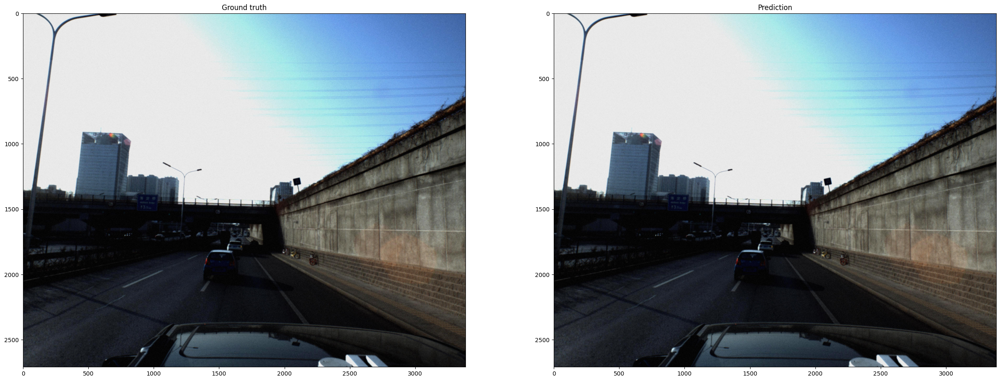

torch.Size([3, 320, 1024]) (40, 128) (7, 40, 128)
point is behind camera


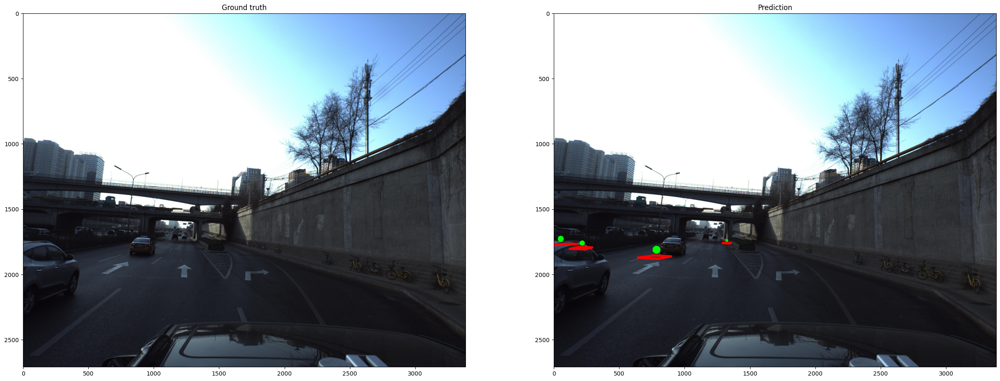

torch.Size([3, 320, 1024]) (40, 128) (7, 40, 128)
point is behind camera


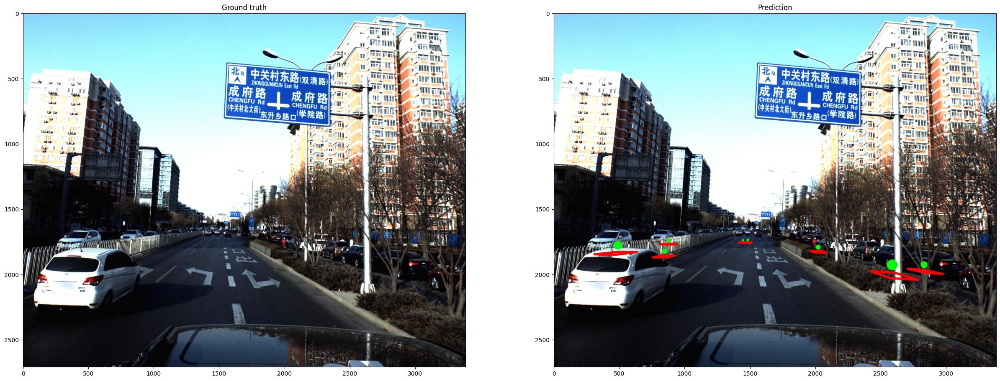

torch.Size([3, 320, 1024]) (40, 128) (7, 40, 128)
point is behind camera


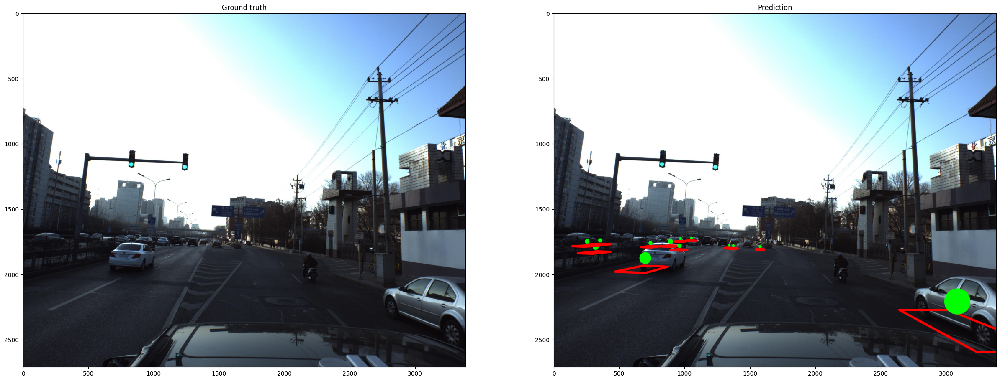

torch.Size([3, 320, 1024]) (40, 128) (7, 40, 128)
point is behind camera


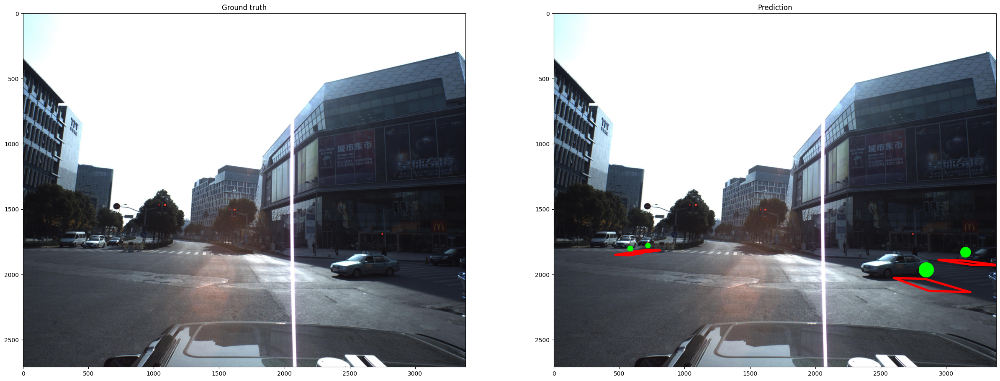

torch.Size([3, 320, 1024]) (40, 128) (7, 40, 128)
point is behind camera


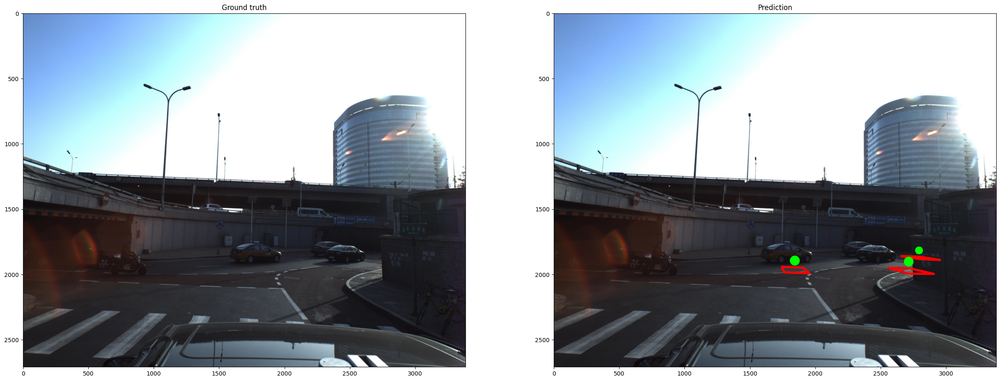

torch.Size([3, 320, 1024]) (40, 128) (7, 40, 128)
point is behind camera


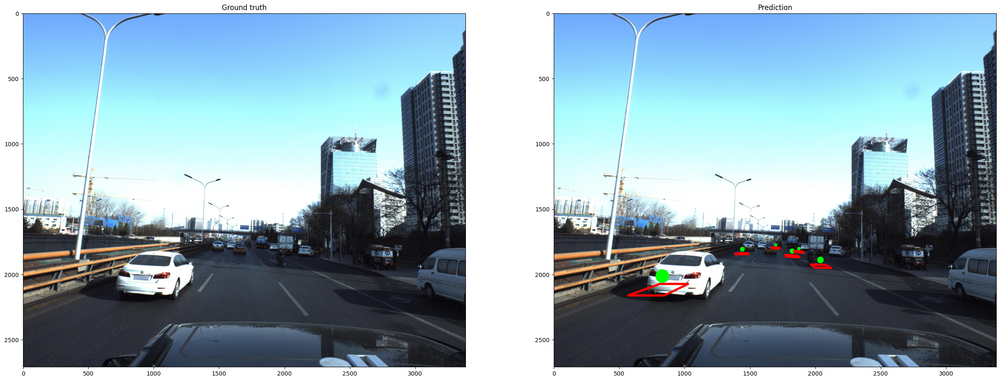

torch.Size([3, 320, 1024]) (40, 128) (7, 40, 128)
point is behind camera


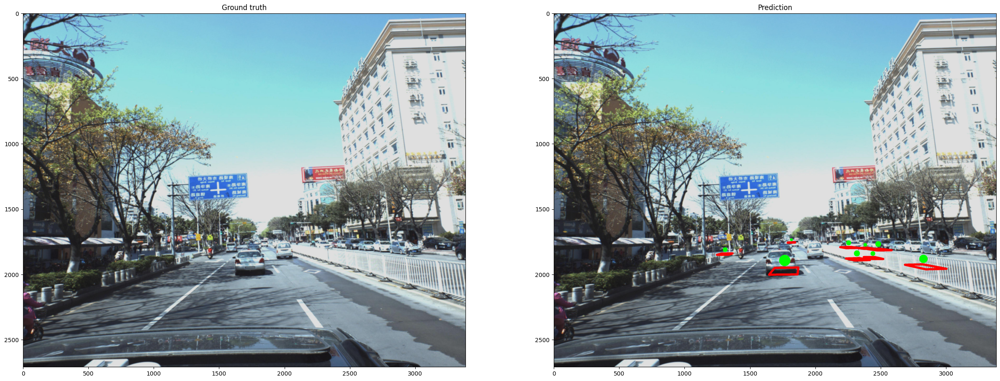

In [7]:
from visualize import visualize_model

model = CenterNet(8, backbone=cfg["BACKBONE"], fpn=cfg['FPN']).to(device)
model.load_state_dict(torch.load(weight_path))
test_dataset = CarDataset(df_test, test_images_dir, cfg=cfg, training=False, transform=test_transform)

history = pd.DataFrame()
evaluate_model(epoch=0,
               model=model, 
               dev_loader=train_loader, 
               criterion=partial_criterion,
               history=history, 
               device=device)
predictions = test_model(model, test_dataset, tqdm_disabled=TQDM_DISABLED)
visualize_model(model, test_dataset, df_test, test_images_dir)


In [8]:
SUBMIT = False
if SUBMIT:
    prediction_file = prepare_submission(predictions, save_folder, save_folder)
    submit(prediction_file, extra_note=extra_note)

        ImageId                                   PredictionString
0  ID_18fb86d04                                                   
1  ID_ce06d4dc1  0.14219356 0.3187058808755703 -3.0935376902394...
2  ID_afe07078f  0.15391111 -3.0916460597370468 -3.131820600601...
3  ID_37caf75aa  0.14546508 -0.0035711059850752095 -3.105378618...
4  ID_7655363ca  0.14438856 3.11856590117769 -3.116112968074628...
100%|██████████████████████████████████████| 1.85M/1.85M [00:01<00:00, 1.13MB/s]
Successfully submitted to Peking University/Baidu - Autonomous Driving